# Differential optimization

In [4]:
from diff_optim import *
import functools

I will be expementing with functions from **BBOB** benchmark (as shown on the practicals). 
Specifically with:
```
f01_sphere,
f02_ellipsoidal,
f06_attractive_sector,
f08_rosenbrock,
f10_rotated_ellipsoidal
```
I will be using the default implementation from co_functions.py in 10 dimensions.

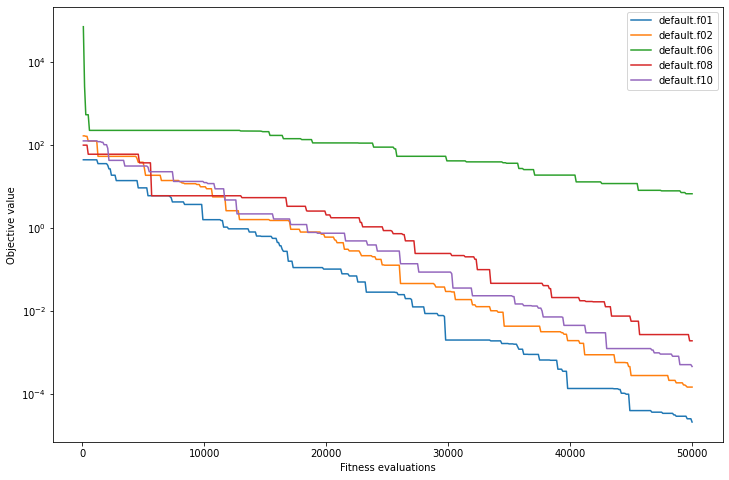

In [6]:
def plot_all(exp_id):
    plt.figure(figsize=(12, 8))
    plt.yscale("log")
    utils.plot_experiments(OUT_DIR, list(map(lambda s: exp_id + "." + s, fit_names)))
    plt.show()

def simple_diff_op(pop, cx_prob, F):
    rand_i = random.randrange(0, len(pop))
    x_i, a_i, b_i, c_i = np.random.choice(len(pop), size=4, replace=False)
    x, a, b, c = pop[x_i], pop[a_i], pop[b_i], pop[c_i]
    
    r = np.random.randint(DIMENSION)
    
    y = np.zeros(DIMENSION)

    for i in range(DIMENSION):
        if np.random.random() < cx_prob or i == r:
            y[i] = a[i] + F*(b[i] - c[i])
        else:
            y[i] = x[i]
    
    if(pub_vars.fit_func(x).fitness <= pub_vars.fit_func(y).fitness):
        pop[x_i] = y


def diff_op_random_uniform_f(pop, cx_prob, F_min, F_max):
    rand_i = random.randrange(0, len(pop))
    x_i, a_i, b_i, c_i = np.random.choice(len(pop), size=4, replace=False)
    x, a, b, c = pop[x_i], pop[a_i], pop[b_i], pop[c_i]
    
    r = np.random.randint(DIMENSION)
    
    y = np.zeros(DIMENSION)

    for i in range(DIMENSION):
        if np.random.random() < cx_prob or i == r:
            y[i] = a[i] + (np.random.random()/(F_max - F_min) + F_min)*(b[i] - c[i])
        else:
            y[i] = x[i]
    
    if(pub_vars.fit_func(x).fitness <= pub_vars.fit_func(y).fitness):
        pop[x_i] = y


exp_id = "default"
run_experiment(functools.partial(simple_diff_op, cx_prob=0.9, F=0.8), max_gen=500, pop_size=100, exp_id=exp_id, silent=True)

plot_all(exp_id)

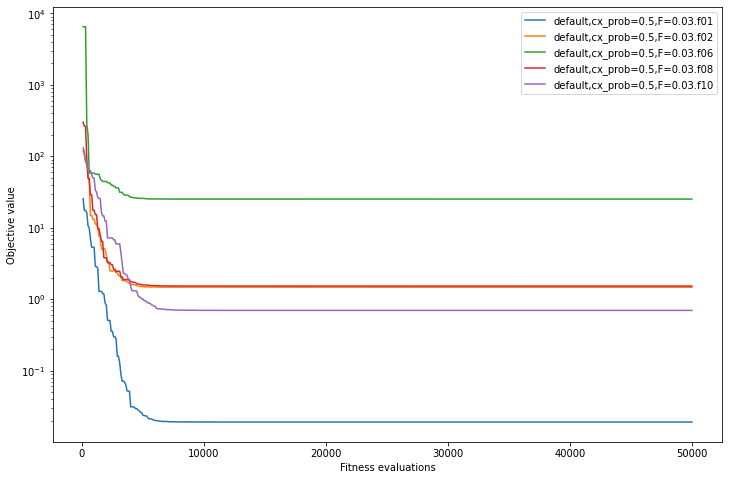

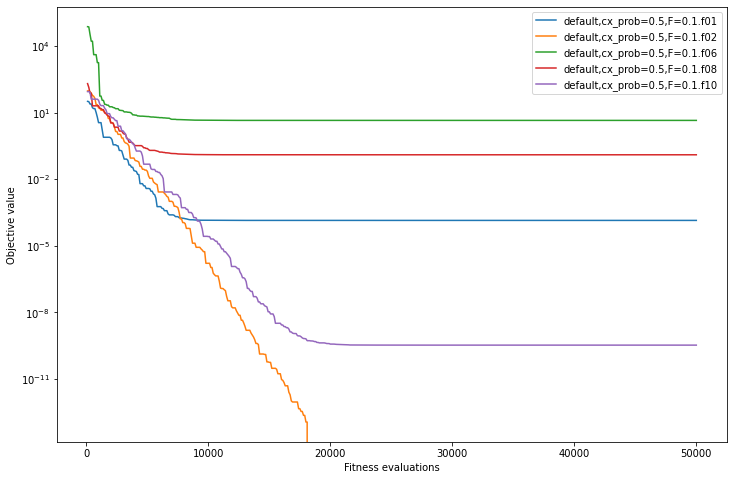

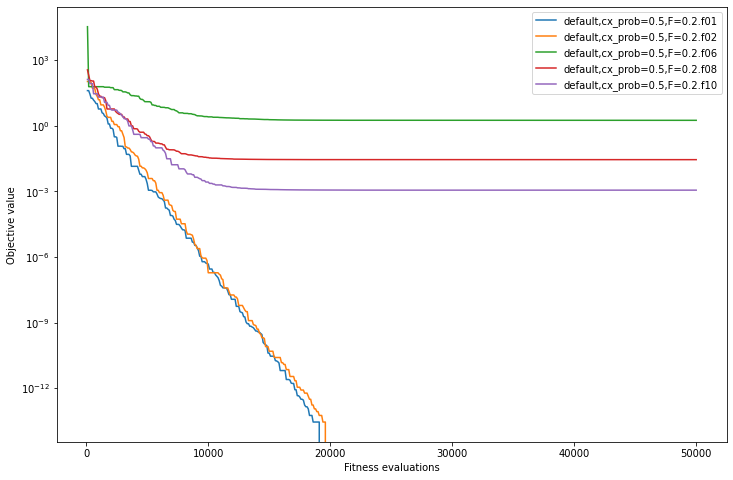

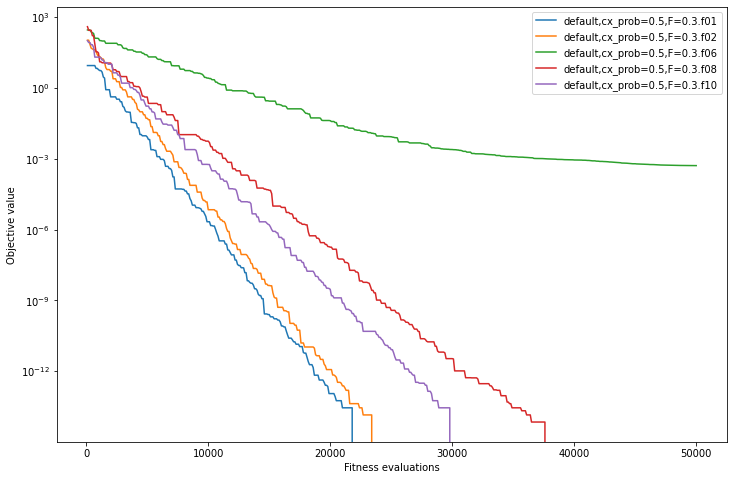

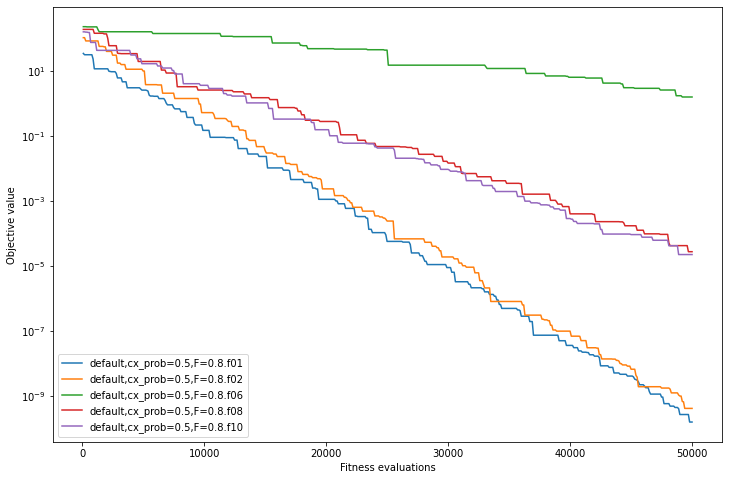

...

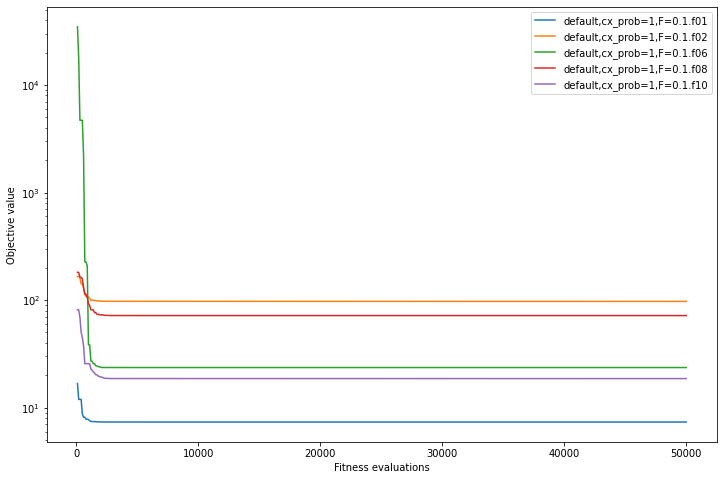

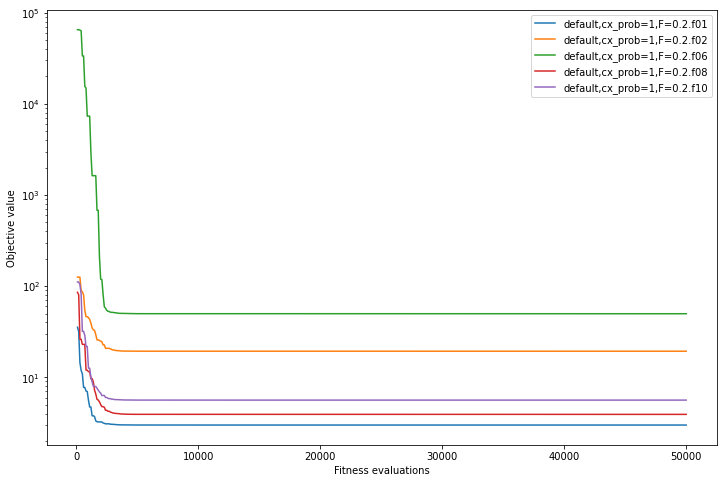

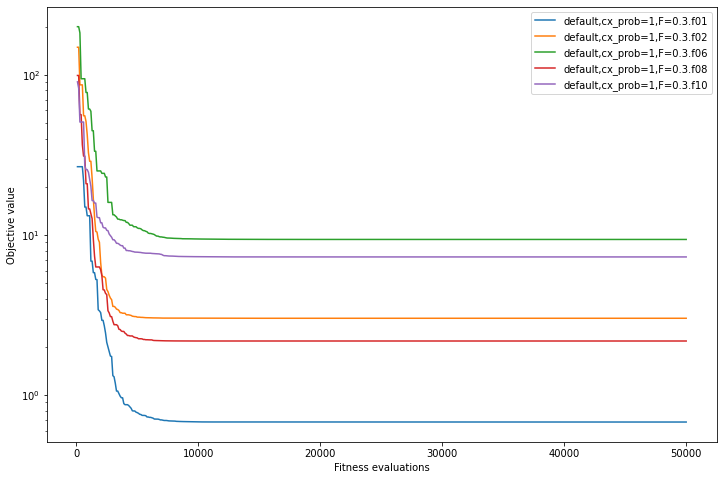

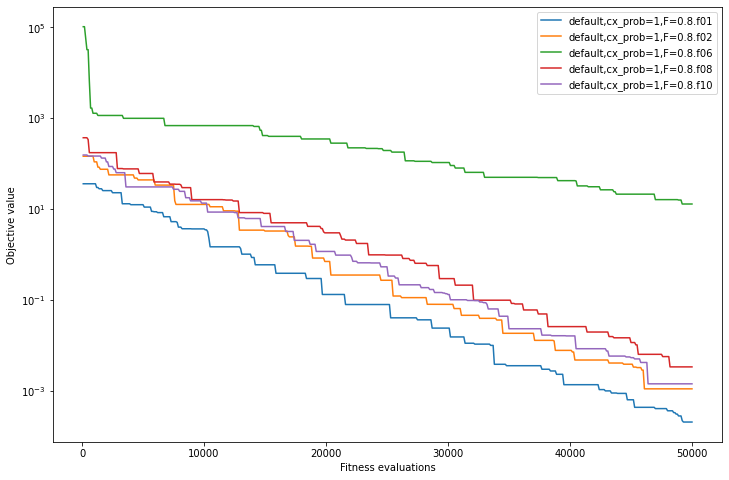

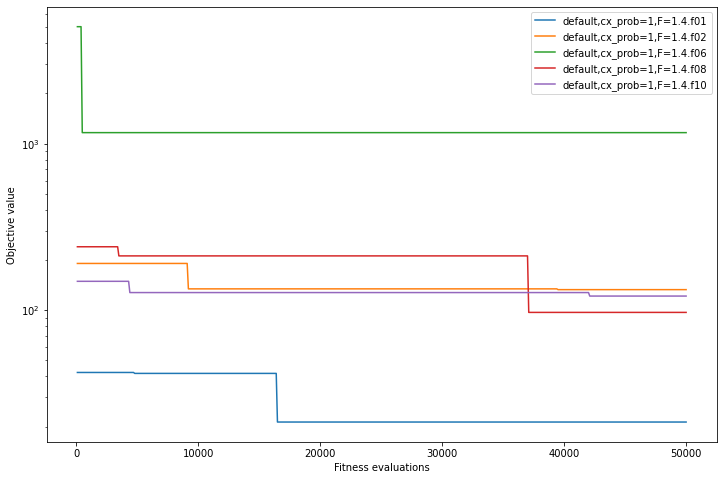

In [3]:
for cx_prob in (0.5, 0.7, 0.9, 1):
    for F in (0.03, 0.1, 0.2, 0.3, 0.8, 1.4):
        exp_id = f"default,cx_prob={cx_prob},F={F}"
        run_experiment(functools.partial(simple_diff_op, cx_prob=cx_prob, F=F), max_gen=500, pop_size=100, exp_id=exp_id, silent=True)
        plot_all(exp_id)

Parameters that showed the fastest convergence are `cx_prob=0.7,F=0.3`. The `F=0.3` is significantly lower than what are the default recommended values (`cx_prob=0.9,F=0.8`). Lowering F runs the risk of ending up in a local optimum, because mutation doesn't change the base that much. Lower `cx_prob` allows for lower `F`, because low `cx_prob` means that not all dimensions are copied to the potential new individual, which makes it harder for the evolution to converge to some local optimum. `cx_prob=0.9,F=0.8` are values that will probably work quite well across many different tasks, will avoid local optima, and given enough time, they will converge. However, if we are little bit bold with the F, we can make the algorithm converge much faster.

## Random F

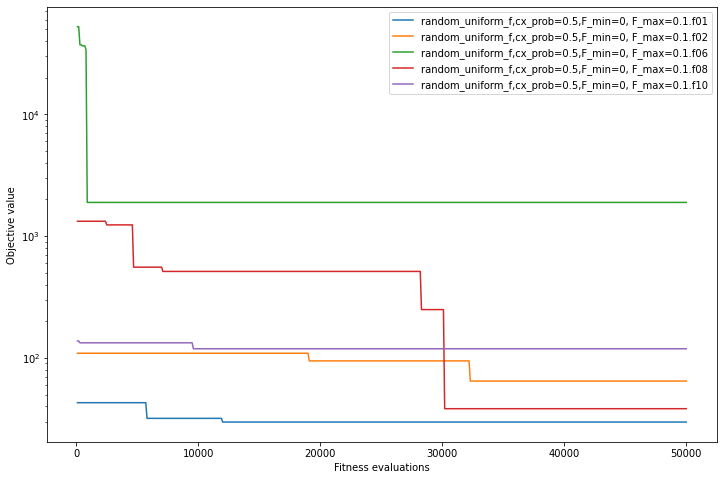

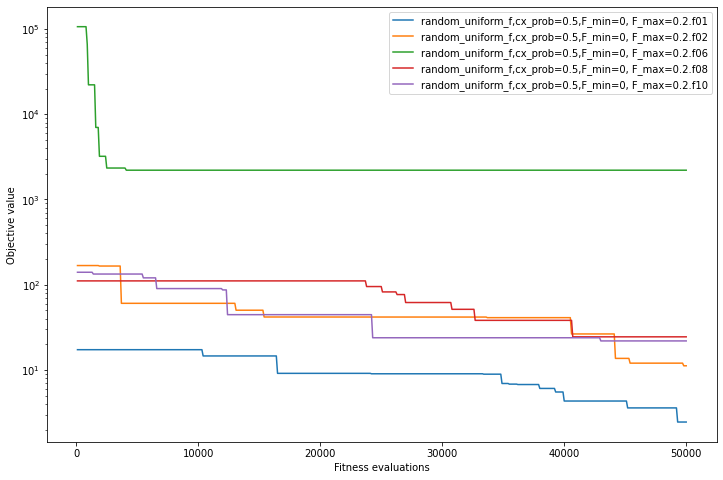

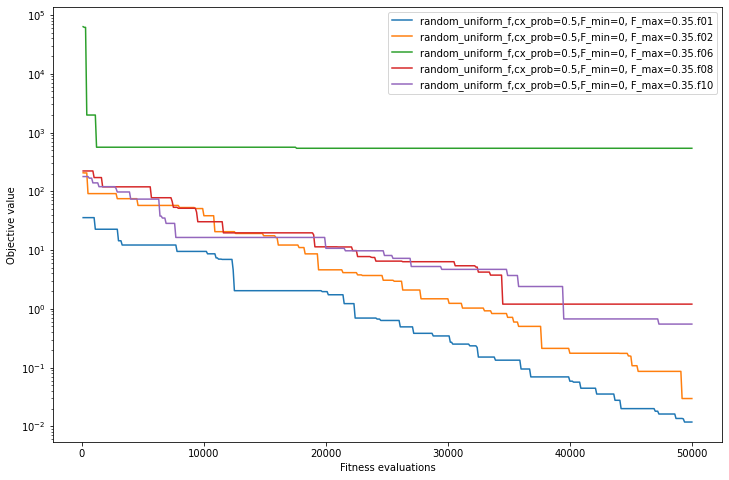

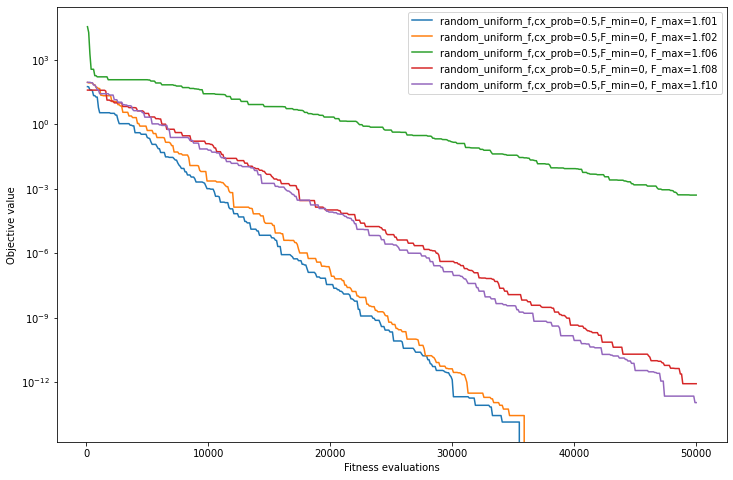

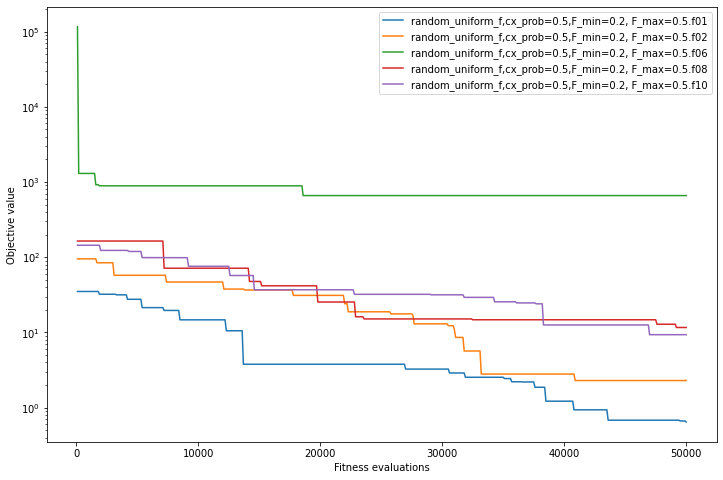

...

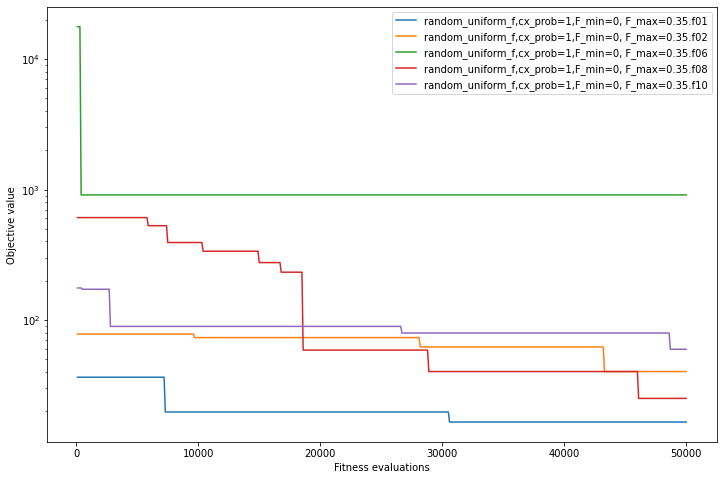

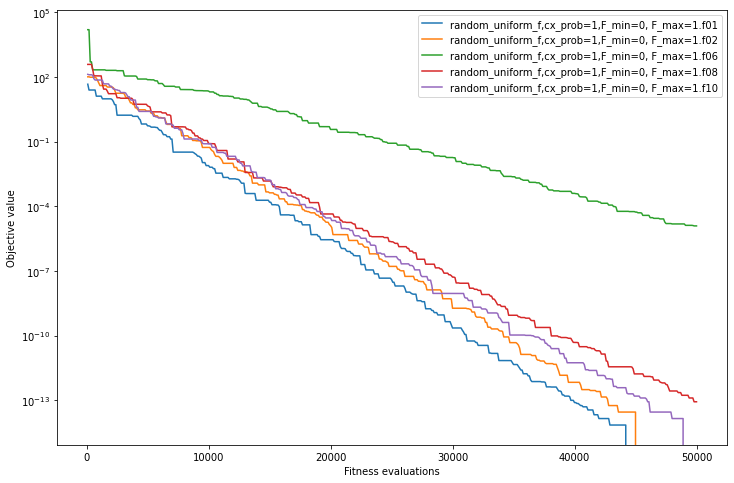

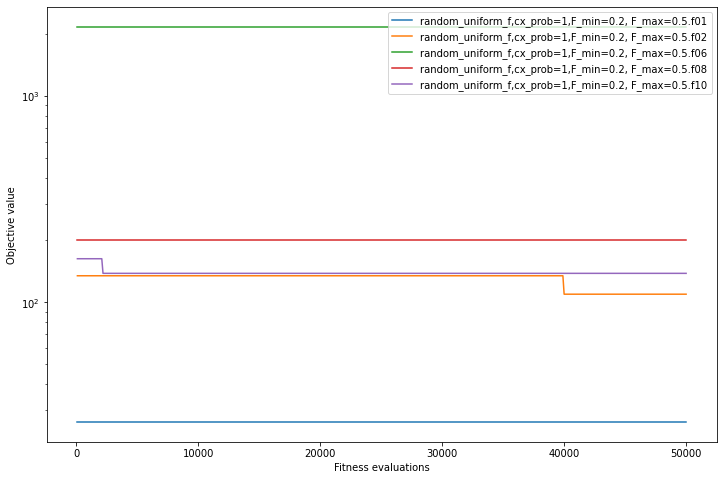

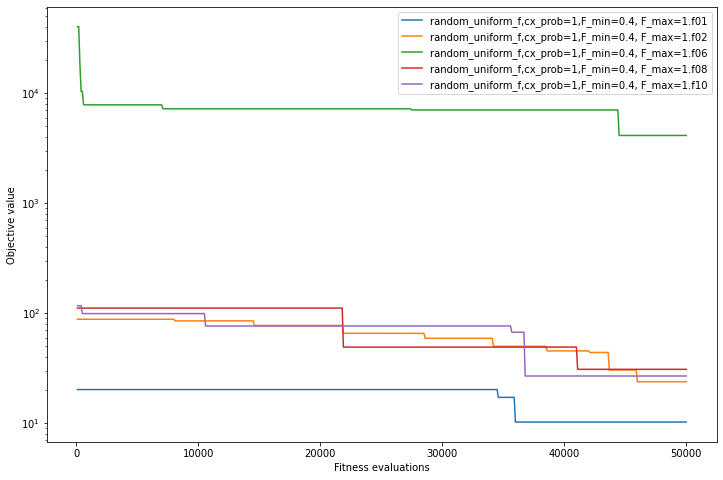

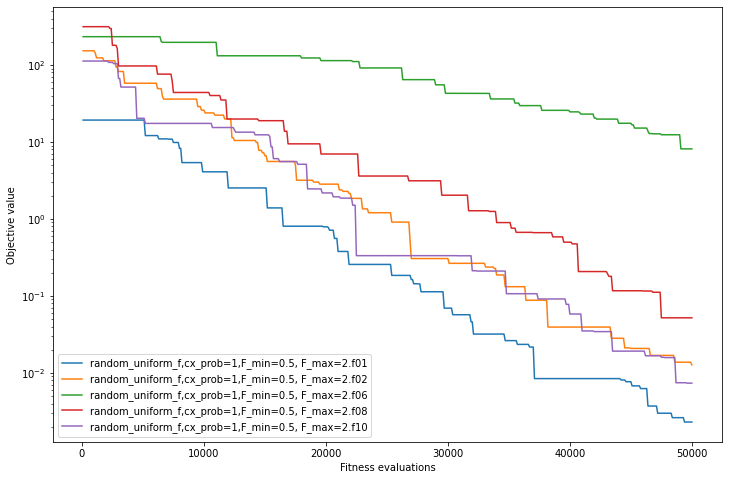

In [4]:
for cx_prob in (0.5, 0.7, 0.9, 1):
    for F_min, F_max in ((0, 0.1), (0, 0.2), (0, .35), (0, 1),(0.2, 0.5), (0.4, 1), (0.5, 2)):
        exp_id = f"random_uniform_f,cx_prob={cx_prob},F_min={F_min}, F_max={F_max}"
        run_experiment(functools.partial(diff_op_random_uniform_f, cx_prob=cx_prob, F_min=F_min, F_max=F_max), max_gen=500, pop_size=100, exp_id=exp_id, silent=True)
        plot_all(exp_id)

We can see similar effects of cx_prob and F on the performance. Again, the best resuts are achived with lower F than the default 0.8, specifically when F is sampled from \[0, 1\] uniformly, which is somewhat comparable to fixed `F=0.5`. Surprisingly, `cx_prob=1` didn't cause the convergence to local optima, as it did in case of fixed F. 

## Scaling up
So far we haven't been able to fully optimize the `f.06` fitness from the BBOP benchmark. So let's bump up the size of population and the number of generations.

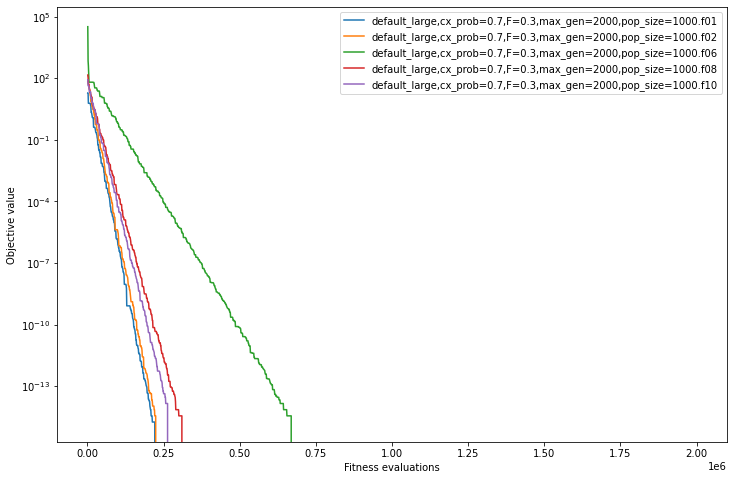

In [4]:
cx_prob=0.7
F=0.3
max_gen=2000
pop_size=1000

exp_id = f"default_large,cx_prob={cx_prob},F={F},max_gen={max_gen},pop_size={pop_size}"
run_experiment(functools.partial(simple_diff_op, cx_prob=cx_prob, F=F), max_gen=max_gen, pop_size=pop_size, exp_id=exp_id, silent=True)

plot_all(exp_id)

## Multiple individuls 
Let's investigate the role of multiple individuals in computation of the update vector

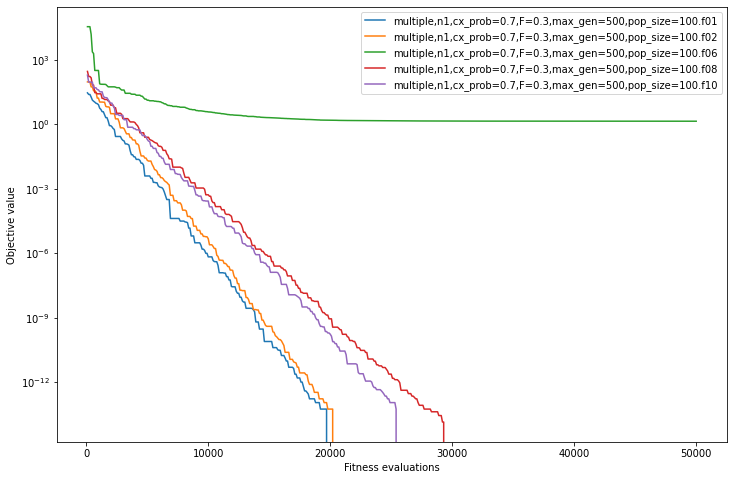

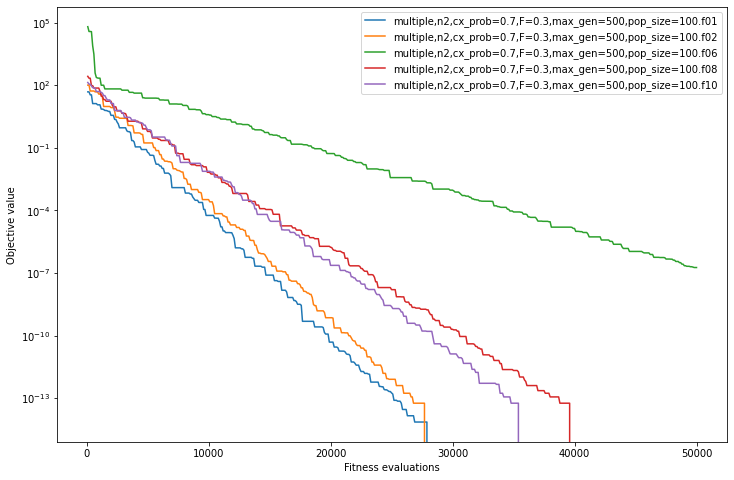

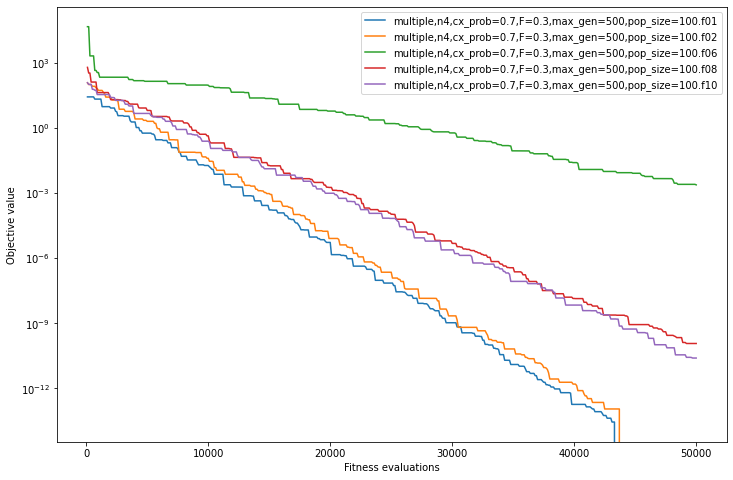

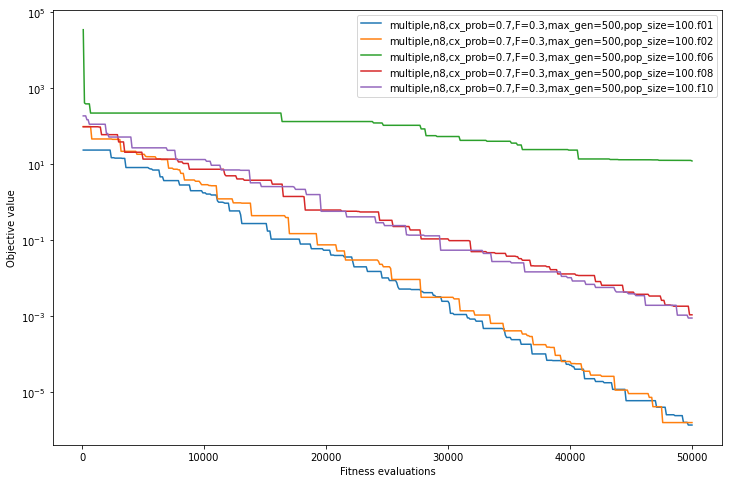

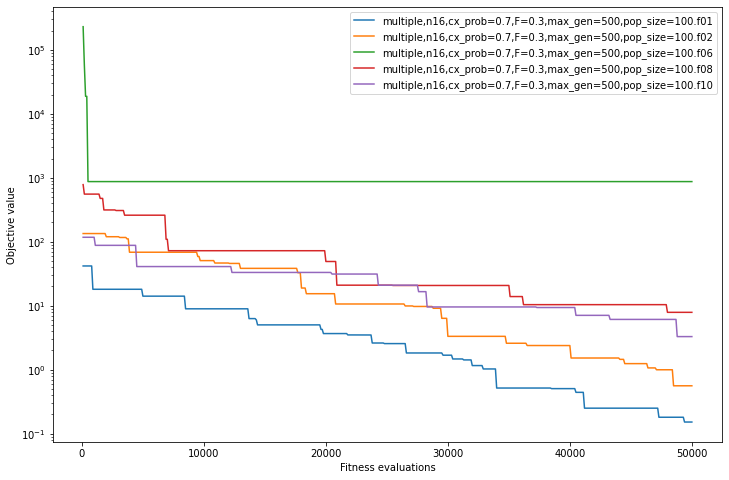

In [9]:
def diff_op_multilpe(pop, cx_prob, F, n):
    rand_i = random.randrange(0, len(pop))
    indeces = np.random.choice(len(pop), size=2 + 2*n, replace=False)
    x_i, a = indeces[0], pop[indeces[1]]
    x = pop[x_i]

    b = sum(np.array([pop[i] for i in indeces[2::2]]))
    c = sum(np.array([pop[i] for i in indeces[3::2]]))
    
    r = np.random.randint(DIMENSION)
    
    y = np.zeros(DIMENSION)

    for i in range(DIMENSION):
        if np.random.random() < cx_prob or i == r:
            y[i] = a[i] + F*(b[i] - c[i])
        else:
            y[i] = x[i]
    
    if(pub_vars.fit_func(x).fitness <= pub_vars.fit_func(y).fitness):
        pop[x_i] = y

cx_prob=0.7
F=0.3
max_gen=500
pop_size=100

for n in [1, 2, 4, 8, 16]:
    exp_id = f"multiple,n{n},cx_prob={cx_prob},F={F},max_gen={max_gen},pop_size={pop_size}"
    run_experiment(functools.partial(diff_op_multilpe, cx_prob=cx_prob, F=F, n=n), max_gen=max_gen, pop_size=pop_size, exp_id=exp_id, silent=True)
    plot_all(exp_id)



Number of individuals has some kind of regalirization effect. When n=1, f06 is stuck in local optimum, increasing n to n=2 prevents this, but at the expense of convergence speed. When n is too large, the update vector is less specific and involves individuals from many different areas of search space, which makes the differential information too mixed up and  useless.